# Chocolate Rating Classification
#### CHAPTER 05: _Local Model-agnostic Interpretation Methods_
##### From **Interpretable Machine Learning with Python 2nd Edition** by Serg Masís, published by Packt

## The Preparations

### Installing the Libraries

In [ ]:
!pip install pandas==1.3.5
!pip install numpy==1.21.6
!pip install scikit-learn==1.0.2
!pip install matplotlib==3.5.1
!pip install seaborn==0.11.0

!pip install nltk==3.4.5
!pip install tensorflow==2.2.0
!pip install lightgbm==3.3.2
!pip install shap==0.37.0
!pip install lime==0.2.0.1

In [ ]:
!pip install pathlib2==2.3.5
!pip install scipy==1.4.1
!pip install statsmodels==0.11.0
!pip install mlxtend==0.19.0
!pip install pycebox==0.0.1
!pip install alibi==0.6.5
!pip install aif360==0.3.0
!pip install opencv-python==4.4.0.44
!pip install tqdm==4.62.3

### Loading the Libraries

In [1]:
import mldatasets
import pandas as pd
import numpy as np
import math
import re
import nltk
from nltk.probability import FreqDist
from nltk.tokenize import word_tokenize
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from sklearn import metrics, svm
from sklearn.feature_extraction.text import TfidfVectorizer
import lightgbm as lgb
import matplotlib.pyplot as plt
import seaborn as sns
import shap
import lime
import lime.lime_tabular
from lime.lime_text import LimeTextExplainer

### Understanding and Preparing the Data

In [2]:
chocolateratings_df = mldatasets.load("chocolate-bar-ratings_v2")

https://github.com/PacktPublishing/Interpretable-Machine-Learning-with-Python/raw/master/datasets/chocolate-ratings_v2.zip downloaded to /Users/serg/EXTEND/PROJECTS/InterpretableML.ai/v2/programming/Chapter5/data/chocolate-ratings_v2.zip
/Users/serg/EXTEND/PROJECTS/InterpretableML.ai/v2/programming/Chapter5/data/chocolate-ratings_v2.zip uncompressed to /Users/serg/EXTEND/PROJECTS/InterpretableML.ai/v2/programming/Chapter5/data/chocolate-ratings_v2
1 dataset files found in /Users/serg/EXTEND/PROJECTS/InterpretableML.ai/v2/programming/Chapter5/data/chocolate-ratings_v2 folder
parsing /Users/serg/EXTEND/PROJECTS/InterpretableML.ai/v2/programming/Chapter5/data/chocolate-ratings_v2/chocolate_v2.csv


In [3]:
chocolateratings_df

,company,company_location,review_date,country_of_bean_origin,cocoa_percent,rating,counts_of_ingredients,cocoa_butter,vanilla,lecithin,salt,sugar,sweetener_without_sugar,first_taste,second_taste,third_taste,fourth_taste
0,5150,U.S.A,2019,Madagascar,76.0,3.75,3,1,0,0,0,1,0,cocoa,blackberry,robust,NaN
1,5150,U.S.A,2019,Dominican republic,76.0,3.50,3,1,0,0,0,1,0,cocoa,vegetal,savory,NaN
2,5150,U.S.A,2019,Tanzania,76.0,3.25,3,1,0,0,0,1,0,rich,fatty,bready,NaN
3,A. Morin,France,2012,Peru,63.0,3.75,4,1,0,1,0,1,0,fruity,melon,roasty,NaN
4,A. Morin,France,2012,Bolivia,70.0,3.50,4,1,0,1,0,1,0,vegetal,nutty,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2219,Zotter,Austria,2014,Blend,80.0,2.75,4,1,0,0,1,0,1,waxy,cloying,vegetal,NaN
2220,Zotter,Austria,2017,Colombia,75.0,3.75,3,1,0,0,0,1,0,strong nutty,marshmallow,NaN,NaN
2221,Zotter,Austria,2018,Belize,72.0,3.50,3,1,0,0,0,1,0,muted,roasty,accessible,NaN
2222,Zotter,Austria,2018,Congo,70.0,3.25,3,1,0,0,0,1,0,fatty,mild nuts,mild fruit,NaN


#### Data Preparation

In [4]:
tastes_df = chocolateratings_df[['first_taste', 'second_taste', 'third_taste', 'fourth_taste']]
chocolateratings_df = chocolateratings_df.\
                    drop(['first_taste', 'second_taste', 'third_taste', 'fourth_taste'], axis=1)
tastes_df.head(90).tail(10)

,first_taste,second_taste,third_taste,fourth_taste
80,oily,vegetal,nutty,cocoa
81,oily,vanilla,melon,cocoa
82,rich,sour,mild smoke,NaN
83,fruity,sour,NaN,NaN
84,roast,high astringent,NaN,NaN
85,smokey,savory,NaN,NaN
86,sandy,roasty,nutty,NaN
87,roasty,brownie,nutty,NaN
88,red wine,rich,long,NaN
89,creamy,fruit,cocoa,NaN


In [5]:
chocolateratings_df = mldatasets.make_dummies_with_limits(chocolateratings_df,\
                                        'company_location', 0.03333)
chocolateratings_df = mldatasets.make_dummies_with_limits(chocolateratings_df,\
                                        'country_of_bean_origin', 0.03333)

In [6]:
tastes_s = tastes_df.replace(np.nan, '', regex=True).\
            agg(' '.join, axis=1).str.strip()

In [7]:
print(tastes_s)

0          cocoa blackberry robust
1             cocoa vegetal savory
2                rich fatty bready
3              fruity melon roasty
4                    vegetal nutty
                   ...            
2219          waxy cloying vegetal
2220      strong nutty marshmallow
2221       muted roasty accessible
2222    fatty mild nuts mild fruit
2223            fatty earthy cocoa
Length: 2224, dtype: object


In [8]:
print(np.unique(tastes_s).shape)

(2178,)


In [9]:
tastewords_fdist = FreqDist(word for word in\
                            word_tokenize(tastes_s.str.cat(sep=' ')))
tastewords_df = pd.DataFrame.from_dict(tastewords_fdist,\
                                       orient='index').\
                                rename(columns={0:'freq'})
commontastes_l = tastewords_df[tastewords_df.freq > 74].index.to_list()
print(commontastes_l)

['cocoa', 'rich', 'fatty', 'roasty', 'nutty', 'sweet', 'sandy', 'sour', 'intense', 'mild', 'fruit', 'sticky', 'earthy', 'spice', 'molasses', 'floral', 'spicy', 'woody', 'coffee', 'berry', 'vanilla', 'creamy']


In [10]:
chocolateratings_df['tastes'] = tastes_s
chocolateratings_df = mldatasets.make_dummies_from_dict(chocolateratings_df,\
                                             'tastes', commontastes_l)

In [11]:
chocolateratings_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2224 entries, 0 to 2223
Data columns (total 46 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   company                                    2224 non-null   object 
 1   review_date                                2224 non-null   int64  
 2   cocoa_percent                              2224 non-null   float64
 3   rating                                     2224 non-null   float64
 4   counts_of_ingredients                      2224 non-null   int64  
 5   cocoa_butter                               2224 non-null   int64  
 6   vanilla                                    2224 non-null   int64  
 7   lecithin                                   2224 non-null   int64  
 8   salt                                       2224 non-null   int64  
 9   sugar                                      2224 non-null   int64  
 10  sweetener_without_sugar 

In [12]:
rand = 9
y = chocolateratings_df['rating'].\
                            apply(lambda x: 1 if x >= 3.5 else 0)
X = chocolateratings_df.drop(['rating','company'], axis=1).copy()
X_train, X_test, y_train, y_test = train_test_split(X, y,\
                                test_size=0.33, random_state=rand)

In [13]:
X_train_nlp = tastes_s[X_train.index]
X_test_nlp = tastes_s[X_test.index]

## Leveraging SHAP’s KernelExplainer for Local Interpretations with SHAP Values

### Train C-Support Vector Classification Model

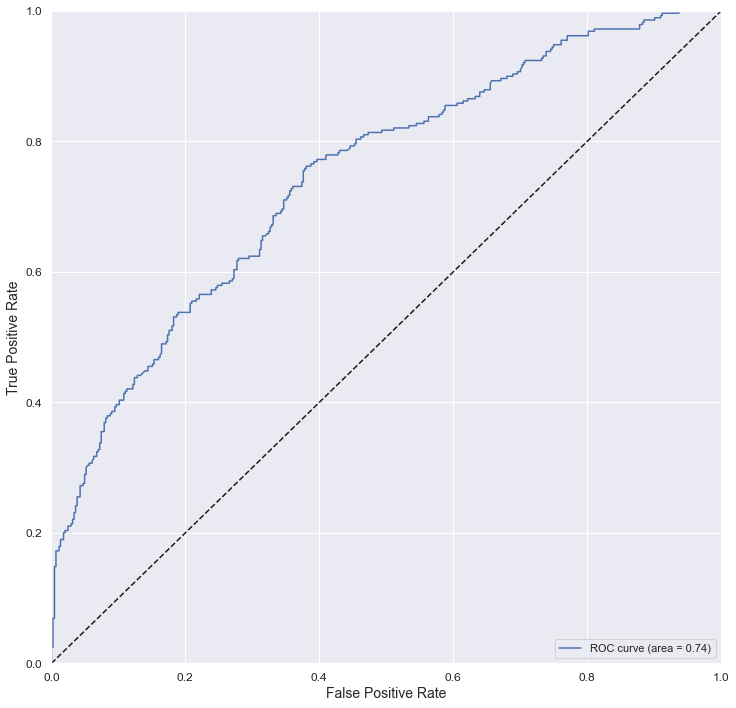

Accuracy_train:  0.7315		Accuracy_test:   0.6989
Precision_test:  0.6845		Recall_test:     0.4414
ROC-AUC_test:    0.7450		F1_test:         0.5367		MCC_test: 0.3461


In [14]:
orig_plt_params = plt.rcParams
sns.set()
svm_mdl = svm.SVC(probability=True, gamma='auto', random_state=rand)
fitted_svm_mdl = svm_mdl.fit(X_train, y_train)
y_train_svc_pred, y_test_svc_prob, y_test_svc_pred =\
        mldatasets.evaluate_class_mdl(fitted_svm_mdl, X_train,\
                                      X_test, y_train, y_test) 

### Computing SHAP Values using KernelExplainer

In [15]:
svm_mdl.classes_

array([0, 1])

In [16]:
np.random.seed(rand)
X_train_summary = shap.kmeans(X_train, 10)
shap_svm_explainer = shap.KernelExplainer(fitted_svm_mdl.predict_proba,\
                                          X_train_summary)
shap_svm_values_test = shap_svm_explainer.shap_values(X_test,\
                                nsamples=200, l1_reg="num_features(20)")

X does not have valid feature names, but SVC was fitted with feature names


  0%|          | 0/734 [00:00<?, ?it/s]

X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names
X does not have valid fea

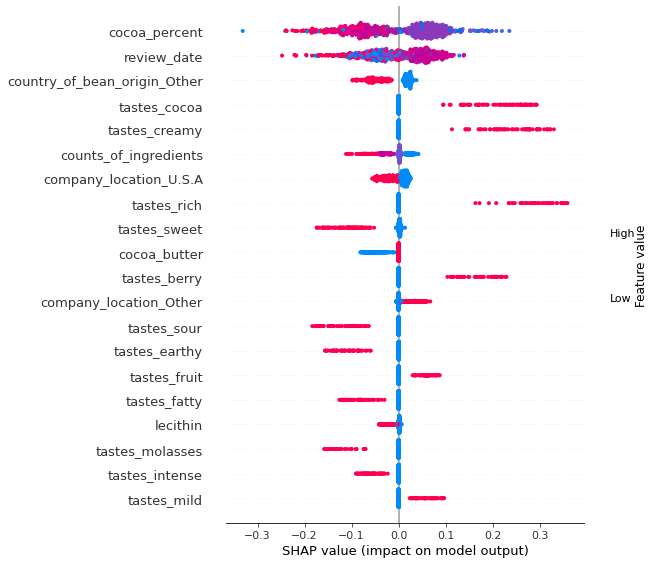

In [17]:
sns.reset_orig()
plt.rcParams.update(orig_plt_params)
shap.summary_plot(shap_svm_values_test[1], X_test, plot_type="dot")

### Local Interpretation for a group of predictions using Decision Plots

In [18]:
sample_test_idx = X_test.index.\
                    get_indexer_for([5,6,7,18,19,21,24,25,27])

In [19]:
expected_value = shap_svm_explainer.expected_value[1]
y_test_shap_pred = (shap_svm_values_test[1].sum(1) + expected_value) > 0.5
print(np.array_equal(y_test_shap_pred, y_test_svc_pred))

True


In [20]:
FN = (~y_test_shap_pred[sample_test_idx]) &\
     (y_test.iloc[sample_test_idx] == 1).to_numpy() 

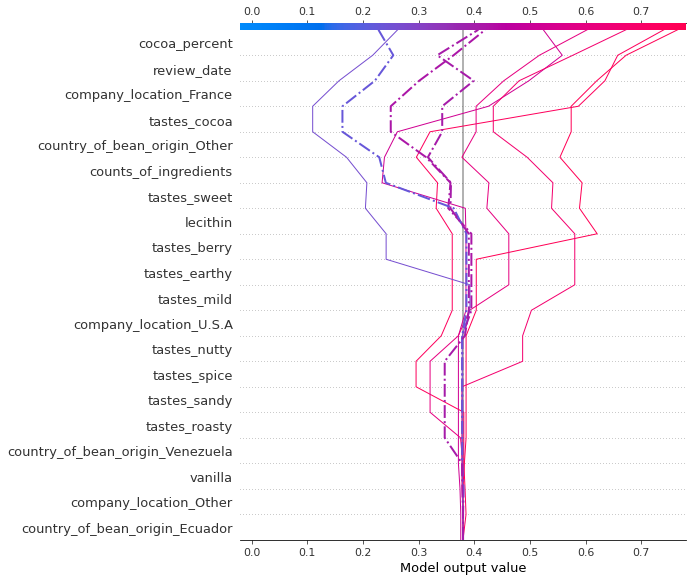

In [21]:
shap.decision_plot(expected_value, shap_svm_values_test[1][sample_test_idx],\
                   X_test.iloc[sample_test_idx], highlight=FN)

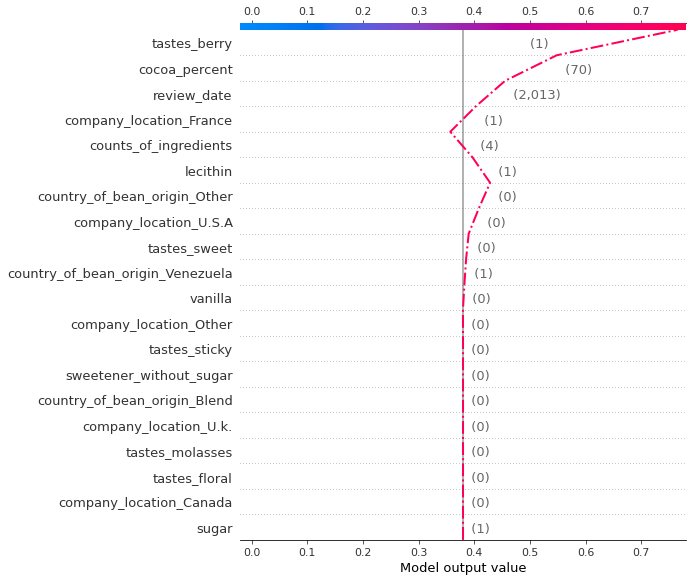

In [22]:
shap.decision_plot(expected_value, shap_svm_values_test[1][696],\
                   X_test.iloc[696], highlight=0)

### Local Interpretation for a single prediction at a time using Force Plot

In [23]:
pd.set_option('precision', 0)
eval_idxs = (X_test.index==5) | (X_test.index==24)
X_test_eval = X_test[eval_idxs]
eval_compare_df = pd.concat([\
            chocolateratings_df.iloc[X_test[eval_idxs].index].rating,\
            pd.DataFrame({'y':y_test[eval_idxs]}, index=[5,24]),\
            pd.DataFrame({'y_pred':y_test_svc_pred[eval_idxs]},\
                         index=[24,5]),
            X_test_eval], axis=1).transpose()
eval_compare_df

,5,24
rating,4,3
y,1,0
y_pred,1,0
review_date,2013,2015
cocoa_percent,70,70
counts_of_ingredients,4,4
cocoa_butter,1,1
vanilla,0,0
lecithin,1,1
salt,0,0


In [24]:
shap.initjs()
shap.force_plot(expected_value, shap_svm_values_test[1][X_test.index==5],\
                X_test[X_test.index==5])

In [25]:
shap.force_plot(expected_value, shap_svm_values_test[1][X_test.index==24],\
                X_test[X_test.index==24])

## Employing Local Interpretable Model-agnostic Explanations (LIME)

### Local Interpretation for a single prediction at a time using LimeTabularExplainer

In [26]:
lime_svm_explainer = lime.lime_tabular.LimeTabularExplainer(X_test.values,\
                        feature_names=X_test.columns, categorical_features=list(range(3,44)),\
                        class_names=['Not Highly Recomm.', 'Highly Recomm.'])

In [27]:
lime_svm_explainer.explain_instance(X_test[X_test.index==5].values[0],\
                                    fitted_svm_mdl.predict_proba,\
                                    num_features=8).\
                                show_in_notebook(predict_proba=True)

X does not have valid feature names, but SVC was fitted with feature names


In [28]:
lime_svm_explainer.explain_instance(X_test[X_test.index==24].values[0],\
                                    fitted_svm_mdl.predict_proba,\
                                    num_features=8).\
                                show_in_notebook(predict_proba=True)

X does not have valid feature names, but SVC was fitted with feature names


## Using LIME for Natural Language Processing

In [29]:
print(X_test_nlp)

1194                 roasty nutty rich
77      roasty oddly sweet marshmallow
121              balanced cherry choco
411                sweet floral yogurt
1259           creamy burnt nuts woody
                     ...              
327          sweet mild molasses bland
1832          intense fruity mild sour
464              roasty sour milk note
2013           nutty fruit sour floral
1190           rich roasty nutty smoke
Length: 734, dtype: object


In [30]:
vectorizer = TfidfVectorizer(lowercase=False)
X_train_nlp_fit = vectorizer.fit_transform(X_train_nlp)
X_test_nlp_fit = vectorizer.transform(X_test_nlp)

In [31]:
pd.set_option('precision', 6)
pd.DataFrame({'taste':vectorizer.get_feature_names(),\
              'tf-idf': np.asarray(X_test_nlp_fit[X_test_nlp.index==5].todense())[0]}).\
    sort_values(by='tf-idf', ascending=False).\
head(5)

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.


,taste,tf-idf
305,raspberry,0.585538
259,nut,0.491542
265,oily,0.463973
64,caramel,0.447504
274,papaya,0.000000


### Train LightGBM Model

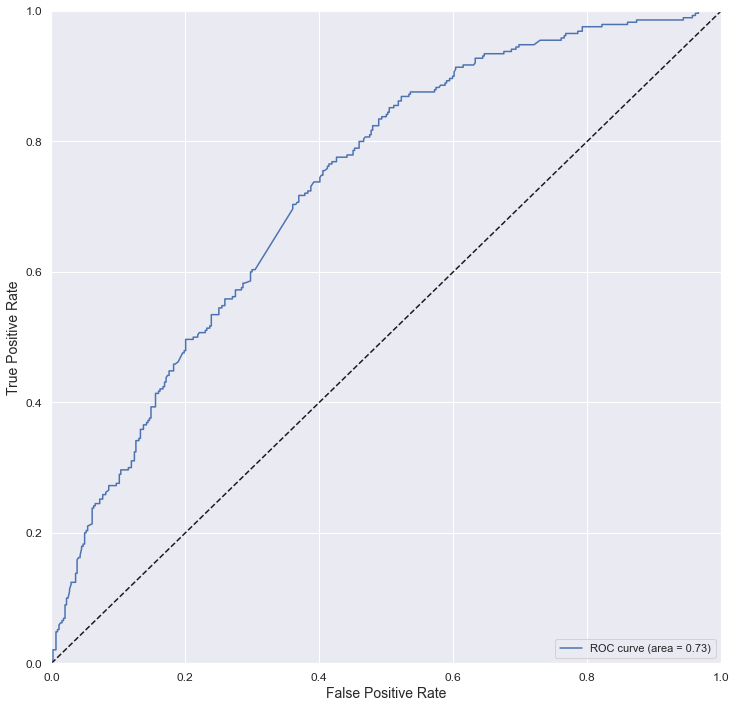

Accuracy_train:  0.7980		Accuracy_test:   0.6744
Precision_test:  0.6123		Recall_test:     0.4793
ROC-AUC_test:    0.7298		F1_test:         0.5377		MCC_test: 0.2973


In [32]:
sns.set()
lgb_mdl = lgb.LGBMClassifier(max_depth=13, learning_rate=0.05,\
            n_estimators=100, objective='binary', random_state=rand)
fitted_lgb_mdl = lgb_mdl.fit(X_train_nlp_fit, y_train)
y_train_lgb_pred, y_test_lgb_prob, y_test_lgb_pred =\
    mldatasets.evaluate_class_mdl(fitted_lgb_mdl, X_train_nlp_fit,\
                                  X_test_nlp_fit, y_train, y_test) 

### Local Interpretation for a single prediction at a time using LimeTextExplainer

In [33]:
lgb_pipeline = make_pipeline(vectorizer, lgb_mdl)

In [34]:
lime_lgb_explainer = LimeTextExplainer(class_names=['Not Highly Recomm.', 'Highly Recomm.'])

In [35]:
lime_lgb_explainer.explain_instance(X_test_nlp[X_test_nlp.index==5].values[0],\
                                    lgb_pipeline.predict_proba, num_features=4).\
                                    show_in_notebook(text=True)

In [36]:
lime_lgb_explainer.explain_instance(X_test_nlp[X_test_nlp.index==24].values[0],\
                                    lgb_pipeline.predict_proba, num_features=4).\
                                    show_in_notebook(text=True)

In [37]:
lime_lgb_explainer.explain_instance('creamy rich complex fruity',\
                                    lgb_pipeline.predict_proba, num_features=4).\
                                    show_in_notebook(text=True)
lime_lgb_explainer.explain_instance('sour bitter roasty molasses',\
                                    lgb_pipeline.predict_proba, num_features=4).\
                                    show_in_notebook(text=True)
lime_lgb_explainer.explain_instance('nasty disgusting gross stuff',\
                                    lgb_pipeline.predict_proba, num_features=4).\
                                    show_in_notebook(text=True)

## Trying SHAP for Natural Language Processing

In [38]:
predict_fn = lambda X: lgb_mdl.predict_proba(X)[:,1]

np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html
np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html


  0%|          | 0/50 [00:00<?, ?it/s]

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.


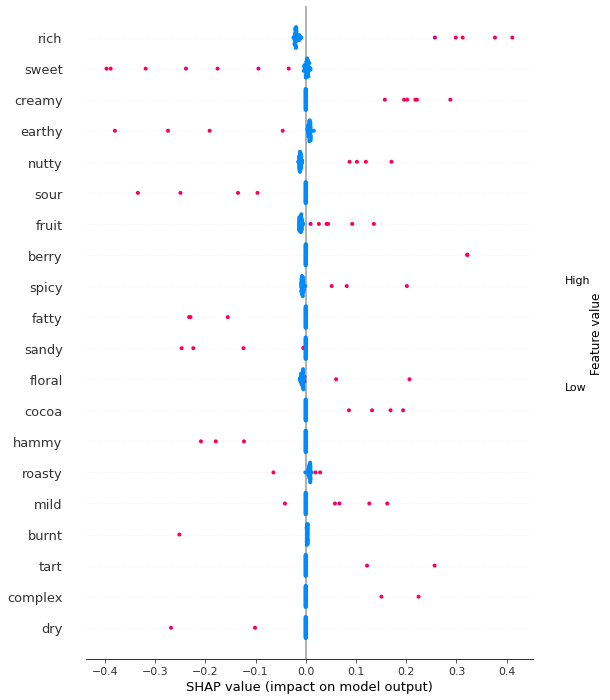

In [39]:
sns.reset_orig() 
plt.rcParams.update(orig_plt_params) 
X_test_nlp_samp_df = pd.DataFrame(shap.sample(X_test_nlp_fit, 50).todense())
shap_lgb_explainer = shap.KernelExplainer(predict_fn,\
                            shap.kmeans(X_train_nlp_fit.todense(), 10))
shap_lgb_values_test = shap_lgb_explainer.shap_values(X_test_nlp_samp_df,\
                                            l1_reg="num_features(20)")
shap.summary_plot(shap_lgb_values_test, X_test_nlp_samp_df,\
            plot_type="dot", feature_names=vectorizer.get_feature_names(),\
            plot_size=(10,12)) 

In [40]:
print(shap.sample(X_test_nlp, 50).to_list()[18])

woody earthy medicinal


In [41]:
shap.force_plot(shap_lgb_explainer.expected_value, shap_lgb_values_test[18,:], 
                X_test_nlp_samp_df.iloc[18,:], feature_names=vectorizer.get_feature_names())

In [42]:
print(shap.sample(X_test_nlp, 50).to_list()[9])

intense spicy floral


In [43]:
shap.force_plot(shap_lgb_explainer.expected_value, shap_lgb_values_test[9,:], 
                X_test_nlp_samp_df.iloc[9,:], feature_names=vectorizer.get_feature_names()) 